# Petty Theft experiment: improved model

This notebooks contains the data processing, building and training part of the model used for the enhanced iteration of the petty theft experiment. 

In [1]:
import shap
import random
import joblib
import numpy as np
import pandas as pd
import lightgbm as lgb
from keras import layers
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.utils import class_weight
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import BinaryLabelDatasetMetric
from sklearn.model_selection import train_test_split
from aif360.algorithms.preprocessing import Reweighing
from fairlearn.postprocessing import ThresholdOptimizer
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import classification_report,confusion_matrix
from witwidget.notebook.visualization import WitWidget, WitConfigBuilder

pip install 'aif360[inFairness]'


## Functions and Utils

In [2]:
def minmax_scaler(data):
  scaler = MinMaxScaler()
  scaled = scaler.fit_transform(data)
  return scaled

def process_data(data):
  x = data.loc[:, data.columns != 'Tipo salida 2']
  y = data['Tipo salida 2']

  x_cat = x[['Region', 'Defensor', 'Desarrollo','extranjero']]
  x_cat['Region'] = label_encoder.fit_transform(x_cat['Region'])
  x_cat['Defensor'] = label_encoder.fit_transform(x_cat['Defensor'])
  x_cat['Desarrollo'] = label_encoder.fit_transform(x_cat['Desarrollo'])
  x_cat['extranjero'] = label_encoder.fit_transform(x_cat['extranjero'])

  x_num = x.loc[:, ~x.columns.isin(x_cat.columns)]

  x_norm = minmax_scaler(x_num)
  x_norm = pd.DataFrame(x_norm, columns = x_num.columns)

  x_norm.reset_index(drop=True, inplace=True)
  x_cat.reset_index(drop=True, inplace=True)

  x_fin = pd.concat([x_norm, x_cat], axis = 1)
  #y_fin = label_encoder.fit_transform(y)

  return x_fin

def custom_predict(examples_to_infer):

  preds = model.predict(model_inputs)
  preds = [[1 - pred[0], pred[0]] for pred in preds]
  return preds

## Importing data and pre-processing

In [3]:
path = r'hurtoFalta.csv'
data = pd.read_csv(path)

## Cambiando las dos RM a una sola

data['Región (tribunal)']=data['Región (tribunal)'].replace('Metropolitana Sur','Metropolitana')
data['Región (tribunal)']=data['Región (tribunal)'].replace('Metropolitana Norte','Metropolitana')

In [4]:
## Agregar variable edad

data['age_uniform'] = np.nan

## Rango de edades basado en los datos del CEAD
edad_min = 18
edad_max = 65

random.seed(23)

for i in range(len(data)):
    data['age_uniform'][i] = round(np.random.uniform(18, 65))

/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/3767326346.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['age_uniform'][i] = round(np.random.uniform(18, 65))
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/3767326346.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['age_uniform'][i] = round(np.random.uniform(18, 65))
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/3767326346.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39954 entries, 0 to 39953
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Región (tribunal)     39954 non-null  object 
 1   Tribunal              39954 non-null  object 
 2   Defensor              39954 non-null  object 
 3   Imputado              39954 non-null  object 
 4   CAUSAIMPUTADOID       39954 non-null  int64  
 5   RUD                   39954 non-null  object 
 6   Fecha término         39954 non-null  object 
 7   Audiencias efectivas  39954 non-null  int64  
 8   Delito                39954 non-null  object 
 9   Grado desarrollo      39954 non-null  object 
 10  Forma término SIGDP   39954 non-null  object 
 11  Forma término         39954 non-null  object 
 12  Multi FT              102 non-null    object 
 13  Tipo salida 1         39954 non-null  object 
 14  age_uniform           39954 non-null  float64
dtypes: float64(1), int6

In [6]:
data.drop(data.columns[[1, 3, 4, 5, 6, 8, 10, 11, 12]], axis=1, inplace=True)
data.rename(columns = {'Región (tribunal)':'region', 
                       'Grado desarrollo':'crime_stage',
                       'Defensor': 'barrister',
                       'Audiencias efectivas': 'effective_hearings'}, inplace = True)

## Data Transformations

In [7]:
x1 = data.loc[:, ~data.columns.isin(['Tipo salida 1'])]
y1 = data.loc[:, data.columns.isin(['Tipo salida 1'])]

In [8]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y1['Tipo salida 1'], test_size=0.3, random_state = 23)

## Del set de entrenamiento, se desprenden 1000 datos para generar un dataset de validación

x_val1 = x_train1[-1000:]
y_val1 = y_train1[-1000:]

In [9]:
x_cat_train = x_train1[['region', 'barrister', 'crime_stage']]
x_cat_test = x_test1[['region', 'barrister', 'crime_stage']]
x_cat_val = x_val1[['region', 'barrister', 'crime_stage']]

In [10]:
label_encoder = preprocessing.LabelEncoder()

x_cat_train['barrister'] = label_encoder.fit_transform(x_cat_train['barrister'])
x_cat_train['crime_stage'] = label_encoder.fit_transform(x_cat_train['crime_stage'])
x_cat_train['region'] = label_encoder.fit_transform(x_cat_train['region'])

x_cat_test['barrister'] = label_encoder.fit_transform(x_cat_test['barrister'])
x_cat_test['crime_stage'] = label_encoder.fit_transform(x_cat_test['crime_stage'])
x_cat_test['region'] = label_encoder.fit_transform(x_cat_test['region'])

x_cat_val['barrister'] = label_encoder.fit_transform(x_cat_val['barrister'])
x_cat_val['crime_stage'] = label_encoder.fit_transform(x_cat_val['crime_stage'])
x_cat_val['region'] = label_encoder.fit_transform(x_cat_val['region'])

/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/2235648610.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_train['barrister'] = label_encoder.fit_transform(x_cat_train['barrister'])
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/2235648610.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_train['crime_stage'] = label_encoder.fit_transform(x_cat_train['crime_stage'])
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/2235648610.py:5: SettingW

In [11]:
x_num_train = x_train1.loc[:, ~x_train1.columns.isin(x_cat_train.columns)]
x_num_test = x_test1.loc[:, ~x_test1.columns.isin(x_cat_test.columns)]
x_num_val = x_val1.loc[:, ~x_val1.columns.isin(x_cat_val.columns)]

In [12]:
x_norm_train = minmax_scaler(x_num_train)
x_norm_train = pd.DataFrame(x_norm_train, columns = x_num_train.columns)

x_norm_test = minmax_scaler(x_num_test)
x_norm_test = pd.DataFrame(x_norm_test, columns = x_num_test.columns)

x_norm_val = minmax_scaler(x_num_val)
x_norm_val = pd.DataFrame(x_norm_val, columns = x_num_val.columns)

In [13]:
for x in range(len(label_encoder.classes_)):
  print(x, label_encoder.classes_[x])

0 Antofagasta
1 Arica y Parinacota
2 Atacama
3 Aysén
4 Bio Bío
5 Coquimbo
6 La Araucanía
7 Libertador Bernardo O'Higgins
8 Los Lagos
9 Los Ríos
10 Magallanes y Antártica Chilena
11 Maule
12 Metropolitana
13 Tarapacá
14 Valparaíso
15 Ñuble


In [14]:
x_cat_train['region_alt'] = x_cat_train['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
x_cat_test['region_alt'] = x_cat_test['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
x_cat_val['region_alt'] = x_cat_val['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)

/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/1526708176.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_train['region_alt'] = x_cat_train['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
/var/folders/dv/yyl2yv_j3hl4xyrt3r2qmh4h0000gn/T/ipykernel_12679/1526708176.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x_cat_test['region_alt'] = x_cat_test['region'].apply(lambda x: 1 if x in {14, 12, 11, 8, 7, 6, 5, 4} else 0)
/var/folders/dv/yyl2yv_j3hl4xyrt3r

In [15]:
x_norm_train.reset_index(drop=True, inplace=True)
x_cat_train.reset_index(drop=True, inplace=True)

x_norm_test.reset_index(drop=True, inplace=True)
x_cat_test.reset_index(drop=True, inplace=True)

x_norm_val.reset_index(drop=True, inplace=True)
x_cat_val.reset_index(drop=True, inplace=True)

In [16]:
x_train_fin = pd.concat([x_norm_train, x_cat_train], axis = 1)
x_test_fin = pd.concat([x_norm_test, x_cat_test], axis = 1)
x_val_fin = pd.concat([x_norm_val, x_cat_val], axis = 1)

In [17]:
y_train_fin = label_encoder.fit_transform(y_train1)
y_test_fin = label_encoder.fit_transform(y_test1)
y_val_fin = label_encoder.fit_transform(y_val1)

## Using AIF360

In [18]:
dataset_train = BinaryLabelDataset(
    df = pd.concat([x_train_fin,pd.DataFrame(y_train_fin, columns = ['Tipo salida 1'])], axis = 1),
    label_names = ['Tipo salida 1'],
    protected_attribute_names = ['region_alt'],
    favorable_label = 1,
    unfavorable_label = 0
)

privileged_groups = [{'region_alt': 1}]
unprivileged_groups = [{'region_alt': 0}]

In [19]:
metric_orig_train = BinaryLabelDatasetMetric(dataset_train,
                                             unprivileged_groups=unprivileged_groups,
                                             privileged_groups=privileged_groups)


# Métrica de equidad (mean difference)
metric_f = metric_orig_train.mean_difference()
print("Diferencia en los resultados medios entre grupos privilegiados y no privilegiados = %f" % metric_f)

Diferencia en los resultados medios entre grupos privilegiados y no privilegiados = -0.059590


In [20]:
RW = Reweighing(unprivileged_groups=unprivileged_groups,
                privileged_groups=privileged_groups)

dataset_transf_train = RW.fit_transform(dataset_train)

In [21]:
metric_orig_train = BinaryLabelDatasetMetric(dataset_transf_train,
                                             unprivileged_groups=unprivileged_groups,
                                             privileged_groups=privileged_groups)

# Métrica de equidad (mean difference)
metric_f_2 = metric_orig_train.mean_difference()

print("Diferencia en los resultados medios entre grupos privilegiados y no privilegiados = %f" % metric_f_2)

Diferencia en los resultados medios entre grupos privilegiados y no privilegiados = 0.000000


In [22]:
x_train_fin.drop(columns = ['region_alt'], inplace = True)
x_test_fin.drop(columns = ['region_alt'], inplace = True)
x_val_fin.drop(columns = ['region_alt'], inplace = True)

## Building the model

In [23]:
train_data = lgb.Dataset(x_train_fin, label=y_train_fin)
val_data = lgb.Dataset(x_val_fin, label=y_val_fin)
test_data = lgb.Dataset(x_test_fin, label=y_test_fin)

In [24]:
## Parámetros

boosting_type = 'gbdt'
num_leaves = 120
max_depth = -1
learning_rate = 0.01
n_estimators = 100
objective = 'binary'
class_weights = class_weight.compute_class_weight(class_weight = "balanced", classes = np.unique(y_train_fin), y = y_train_fin)
class_weight = {0: class_weights[0], 1: class_weights[1]}
sample_weight = dataset_transf_train.instance_weights

In [25]:
## Diccionario de parámetros

model = lgb.LGBMClassifier(
    boosting_type = boosting_type,
    num_leaves = num_leaves,
    max_depth = max_depth,
    learning_rate = learning_rate,
    n_estimators = n_estimators,
    objective = objective,
    class_weight = class_weight
)

In [26]:
model.fit(x_train_fin, y_train_fin, sample_weight = sample_weight)

[LightGBM] [Info] Number of positive: 7859, number of negative: 20108
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 339
[LightGBM] [Info] Number of data points in the train set: 27967, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


LGBMClassifier(class_weight={0: 0.6954197334394271, 1: 1.7792976205624125},
               learning_rate=0.01, num_leaves=120, objective='binary')

## Model Evaluation

In [27]:
## Generando predicciones

predict_train1 = model.predict(x_train_fin)
predict_test1 = model.predict(x_test_fin)

In [28]:
## Matriz de confusión para dataset de entrenamiento

print(confusion_matrix(y_train_fin, predict_train1))
print(classification_report(y_train_fin,predict_train1))

[[15420  4688]
 [ 2335  5524]]
              precision    recall  f1-score   support

           0       0.87      0.77      0.81     20108
           1       0.54      0.70      0.61      7859

    accuracy                           0.75     27967
   macro avg       0.70      0.73      0.71     27967
weighted avg       0.78      0.75      0.76     27967



In [29]:
## Matriz de confusión para dataset de prueba

print(confusion_matrix(y_test_fin,predict_test1))
print(classification_report(y_test_fin,predict_test1))

[[6442 2269]
 [1181 2095]]
              precision    recall  f1-score   support

           0       0.85      0.74      0.79      8711
           1       0.48      0.64      0.55      3276

    accuracy                           0.71     11987
   macro avg       0.66      0.69      0.67     11987
weighted avg       0.75      0.71      0.72     11987



## Using Fairlearn

In [30]:
postprocess_est = ThresholdOptimizer(
    estimator=model,
    constraints="false_negative_rate_parity",  # Optimize FPR and FNR simultaneously
    objective="accuracy_score",
    prefit=True,
    predict_method="predict_proba",
)

In [31]:
postprocess_est.fit(x_train_fin, y_train_fin, sensitive_features = x_train_fin['region'])

ThresholdOptimizer(constraints='false_negative_rate_parity',
                   estimator=LGBMClassifier(class_weight={0: 0.6954197334394271,
                                                          1: 1.7792976205624125},
                                            learning_rate=0.01, num_leaves=120,
                                            objective='binary'),
                   predict_method='predict_proba', prefit=True)

In [32]:
predict_train2 = postprocess_est.predict(x_train_fin, sensitive_features = x_train_fin['region'])
predict_test2 = postprocess_est.predict(x_test_fin, sensitive_features = x_test_fin['region'])

In [33]:
## Matriz de confusión para dataset de entrenamiento 2

print(confusion_matrix(y_train_fin,predict_train2))
print(classification_report(y_train_fin,predict_train2))

[[18080  2028]
 [ 4424  3435]]
              precision    recall  f1-score   support

           0       0.80      0.90      0.85     20108
           1       0.63      0.44      0.52      7859

    accuracy                           0.77     27967
   macro avg       0.72      0.67      0.68     27967
weighted avg       0.75      0.77      0.76     27967



In [34]:
## Matriz de confusión para dataset de prueba 2

print(confusion_matrix(y_test_fin,predict_test2))
print(classification_report(y_test_fin,predict_test2))

[[7741  970]
 [2163 1113]]
              precision    recall  f1-score   support

           0       0.78      0.89      0.83      8711
           1       0.53      0.34      0.42      3276

    accuracy                           0.74     11987
   macro avg       0.66      0.61      0.62     11987
weighted avg       0.71      0.74      0.72     11987



## Saving results and model

In [35]:
test_results = pd.DataFrame(predict_test2, columns=['score'])

x_test1_alt = x_test1.reset_index(drop=True)
y_test1_alt = y_test1.reset_index(drop=True)

test = pd.concat([x_test1_alt, test_results, pd.DataFrame(y_test_fin)], axis = 1)

path2 = r'outputs/preds_pt_improved_uniform.csv'
test.to_csv(path2)

In [36]:
joblib.dump(model, 'outputs/pt_improved_uniform.pkl')

['outputs/pt_improved_uniform.pkl']

## SHAP Values

In [37]:
explainer = shap.Explainer(model, x_train_fin.values[:])
shap_values = explainer(x_train_fin.values[:])
shap_values

100%|===================| 27876/27967 [01:35<00:00]        

.values =
array([[-0.22819587,  0.00221124,  0.46389499,  0.21317992, -0.22429504],
       [ 0.98847814,  0.00484528,  0.14990683,  0.10443671, -0.08591592],
       [ 0.618836  , -0.00494185, -0.14427265, -0.00119954, -0.07450054],
       ...,
       [ 0.28344241,  0.00138345, -0.06270467,  0.08621407,  0.16209508],
       [ 0.37808494, -0.00452423,  0.13118696, -0.04521947,  0.09908565],
       [-0.20327901, -0.00452501,  0.0548705 , -0.05469298, -0.22587209]])

.base_values =
array([-0.13015796, -0.13015796, -0.13015796, ..., -0.13015796,
       -0.13015796, -0.13015796])

.data =
array([[3.57142857e-02, 1.91489362e-01, 4.00000000e+00, 3.06000000e+02,
        1.00000000e+00],
       [0.00000000e+00, 7.44680851e-01, 4.00000000e+00, 6.07000000e+02,
        1.00000000e+00],
       [1.42857143e-01, 4.25531915e-02, 7.00000000e+00, 2.07000000e+02,
        1.00000000e+00],
       ...,
       [7.14285714e-02, 2.97872340e-01, 6.00000000e+00, 9.39000000e+02,
        0.00000000e+00],
       [3.

In [38]:
shap_values.feature_names = list(x_train_fin.columns)

In [39]:
shap_df = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)

# Calcular el valor absoluto y luego el promedio para cada característica
shap_abs_avg = shap_df.abs().mean()
shap_avg = shap_df.mean()
shap_max = shap_df.max()
shap_min= shap_df.min()

print('Media absoluta: ', '\n\n', shap_abs_avg)
print('----------------------------------')
print('Media: ', '\n\n', shap_avg)
print('----------------------------------')
print('Máximo: ', '\n\n', shap_max)
print('----------------------------------')
print('Mínimo: ', '\n\n', shap_min)

Media absoluta:  

 effective_hearings    0.375601
age_uniform           0.009438
region                0.184378
barrister             0.086470
crime_stage           0.186845
dtype: float64
----------------------------------
Media:  

 effective_hearings   -0.032209
age_uniform          -0.003034
region                0.010306
barrister            -0.016339
crime_stage           0.013908
dtype: float64
----------------------------------
Máximo:  

 effective_hearings    1.409012
age_uniform           0.217491
region                1.082900
barrister             0.541803
crime_stage           1.413244
dtype: float64
----------------------------------
Mínimo:  

 effective_hearings   -0.464131
age_uniform          -0.307418
region               -0.725168
barrister            -0.766437
crime_stage          -0.476016
dtype: float64


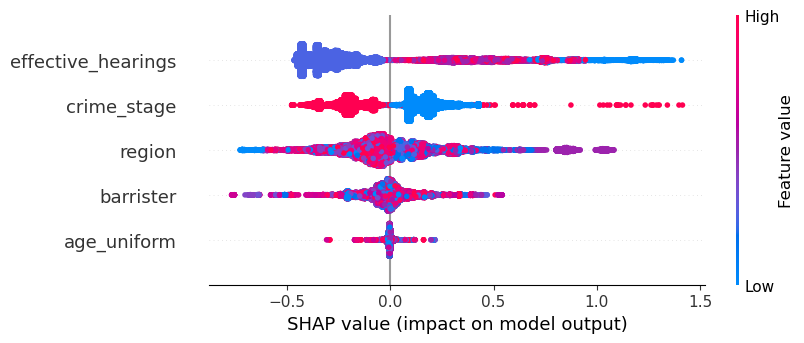

In [40]:
fig, ax = plt.subplots()
shap.plots.beeswarm(shap_values)

In [41]:
fig.savefig("outputs/pt_improved_uniform_shap.pdf", bbox_inches="tight", format="pdf")  # o "shap_plot.svg" para formato SVG

## What if Tool

In [42]:
num_datapoints = y_test_fin.shape[0]
tool_height_in_px = 750

examples_labels = pd.concat([x_test_fin.reset_index(drop=True), pd.DataFrame(y_test_fin, columns = ['Tipo salida 1']).reset_index(drop=True)], axis=1)
columns_not_for_model_input = [examples_labels.columns.get_loc('Tipo salida 1')]

examples_wit = examples_labels.values.tolist()
column_names = examples_labels.columns.tolist()

model_inputs = np.delete(np.array(examples_wit[:num_datapoints]), columns_not_for_model_input, axis=1)

def custom_predict_shap(examples_to_infer):

  preds = model.predict_proba(model_inputs)
  preds = [[pred[0], 1 -  pred[0]] for pred in preds]

  shap_output = explainer(model_inputs)
  attributions = []
  for single_shap_output in shap_output:  # iteramos sobre cada resultado de shap (cada ejemplo)
    attrs = {}
    for i, col in enumerate(x_train_fin.columns):
      attrs[col] = single_shap_output.values[i]  # utilizamos single_shap_output.values
    attributions.append(attrs)

  ret = {'predictions': preds, 'attributions': attributions}

  return ret

In [43]:
# Setup the tool with the test examples and the trained classifier

config_builder = WitConfigBuilder(examples_wit[:num_datapoints],column_names).set_custom_predict_fn(custom_predict_shap).set_target_feature('Tipo salida 1')
WitWidget(config_builder, height=tool_height_in_px)

WitWidget(config={'model_type': 'classification', 'label_vocab': [], 'feature_names': ['effective_hearings', '…